#  01 Photometry Signal Processing


This goal of this signal processing module is to:

1. Import photometry data and crop
1. Deinterleave data
1. Normalize photometry data for photobleaching and calculate dF and z-score
1. Find Peaks in z-scored data
1. Write out processed data and figures

This module will output processed photometry data for plotting in external software, or alignment with timestamps using the alignment (02) and pooling (03) notebooks.

To run each cell, either click the 'Run' button on the toolbar or hit Shift+Enter

For step-by-step instructions, resources and more information on each processing step, see our [Synaptech Suite User Guide](https://static1.squarespace.com/static/60ff345fca665d50e1adc805/t/653c10e675b3ad1436896ee1/1698435302608/SynaptechSuite+User+Guide.pdf).

## Initialize Signal Processing Pipeline

In [1]:
from routine.oo_interface import NPMProcess
process = NPMProcess()

Process initialized


## Import Data and Set Parameters
Run cell to enable data file upload. Then select the file you would like to analyze.

In [2]:
process.set_data()

 ### Specify path to write out processed data and figures

In [3]:
process.set_paths()

### Select ROIs to analyze
CTRL or CMD + click to select multiple

In [4]:
process.set_roi()

### Specify Region Names for ROIs
i.e. mPFC Right and mPFC Left

In [5]:
process.set_roi_names()

Text(value='FrameCounter', description='Region or Animal Corresponding to FrameCounter', layout=Layout(width='…

Text(value='SystemTimestamp', description='Region or Animal Corresponding to SystemTimestamp', layout=Layout(w…

Text(value='LedState', description='Region or Animal Corresponding to LedState', layout=Layout(width='80%'), p…

Text(value='ComputerTimestamp', description='Region or Animal Corresponding to ComputerTimestamp', layout=Layo…

Text(value='G0', description='Region or Animal Corresponding to G0', layout=Layout(width='80%'), placeholder='…

### Specify the number of frames to discard at the beginning of the file
This step helps to improve curve fitting by cropping the steepest part of the decay curve. We recommend starting with 100 frames. If you do not wish to discard any frames, please enter 0.

In [6]:
process.set_nfm_discard()

### Select which channel to use as a reference signal
For GCaMP recordings, we recommend choosing 415
For neurotransmitter biosensors, we recommend consulting the literature for validated normalization methods for the specific sensor you are using.

In [7]:
process.set_baseline()

Dropdown(description='FrameCounter-415nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounter-415…

Dropdown(description='FrameCounter-470nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounter-415…

Dropdown(description='FrameCounter-560nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounter-415…

Dropdown(description='SystemTimestamp-415nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounter-…

Dropdown(description='SystemTimestamp-470nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounter-…

Dropdown(description='SystemTimestamp-560nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounter-…

Dropdown(description='LedState-415nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounter-415nm',…

Dropdown(description='LedState-470nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounter-415nm',…

Dropdown(description='LedState-560nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounter-415nm',…

Dropdown(description='ComputerTimestamp-415nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounte…

Dropdown(description='ComputerTimestamp-470nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounte…

Dropdown(description='ComputerTimestamp-560nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounte…

Dropdown(description='G0-415nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounter-415nm', {('G0…

Dropdown(description='G0-470nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounter-415nm', {('G0…

Dropdown(description='G0-560nm: ', index=15, layout=Layout(width='80%'), options=(('FrameCounter-415nm', {('G0…

## Load and Visualize Raw Data
Select raw data file to analyze

In [9]:
process.load_data()

AttributeError: 'DataFrame' object has no attribute 'dtype'

## Correct for Photobleaching

Order of Operations:

1. Deinterleave data by frame flag (LED)
1. Fit reference signal with a biexponential decay 
1. Linearly scale the fitted decay to the signal of interest using robust fit.
1. Subtract scaled fit from raw signal of interest to yield a normalized signal (dF)
1. z-score data

For more information on dF/F values, see our [Analysis Manual](https://static1.squarespace.com/static/60ff345fca665d50e1adc805/t/653c10e675b3ad1436896ee1/1698435302608/SynaptechSuite+User+Guide.pdf).

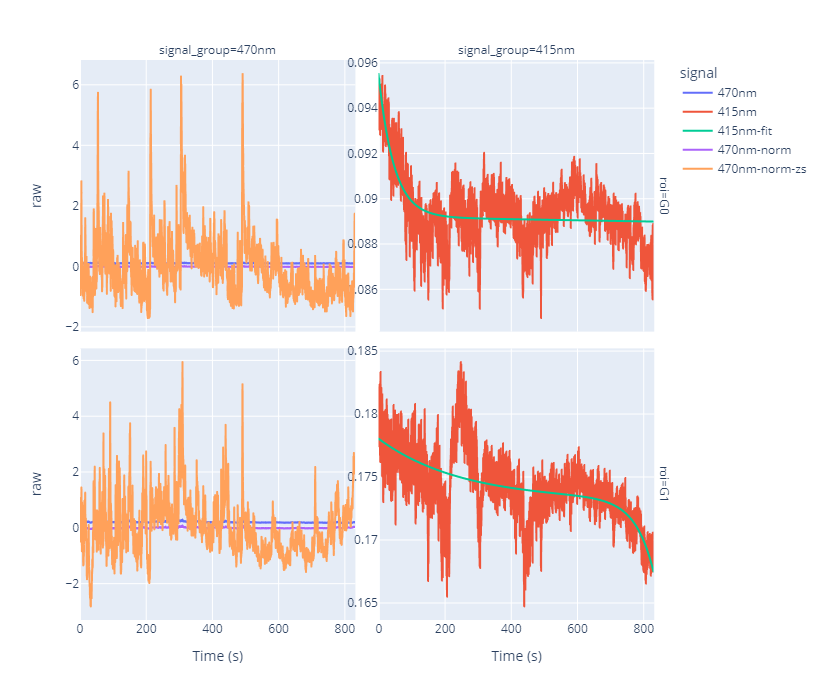

In [10]:
process.photobleach_correction()

## Peak Finding

### Specify Threshold for Peak Finding
Peak finding is run on z-scored data. All peaks with a prominence above threshold will be included

In [11]:
process.set_pk_prominence()

### Find Peaks and Plot

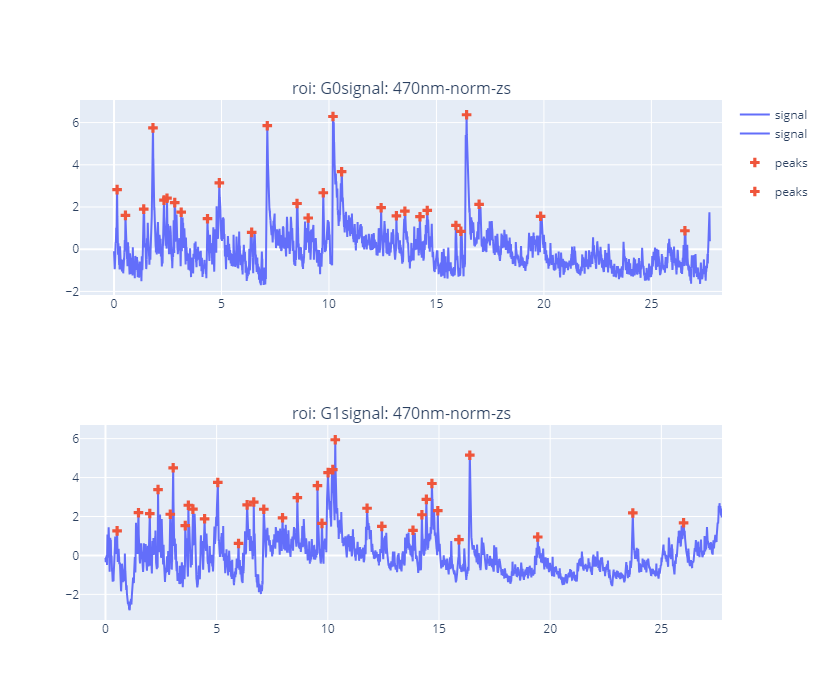

In [12]:
process.find_peaks()

## Save Processed Data
Both dF and z-scored data will be written out

In [13]:
process.export_data()

data saved to ./output/process/signals/415nm.csv
data saved to ./output/process/signals/470nm-norm.csv
data saved to ./output/process/signals/470nm-norm-zs.csv
